<h1>Vypracovali Richard Kello (51%) a Dominik Klušák (49%)</h1>

<h1>Fáza 1 - Prieskumná analýza</h1>

In [162]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
import scipy
import numpy as np
import statsmodels.api as sm
from sklearn.preprocessing import MinMaxScaler


ds_stations=pd.read_csv("./data/stations.csv", sep="\t")
ds_ms=pd.read_csv("./data/measurements.csv", sep="\t")
ds_stations_res = pd.read_csv("./data/stations.csv", sep="\t")
ds_ms_res = pd.read_csv("./data/measurements.csv", sep="\t")

<h2>Opis dát spolu s ich charakteristikami</h2>
Základné informácie o datasetoch stations.csv a measurements.csv

In [163]:
ds_stations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1104 entries, 0 to 1103
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   latitude   1104 non-null   float64
 1   QoS        1104 non-null   object 
 2   location   1104 non-null   object 
 3   station    1104 non-null   object 
 4   revision   1104 non-null   object 
 5   longitude  1104 non-null   float64
dtypes: float64(2), object(4)
memory usage: 51.9+ KB


Počet záznamov je pre dataset stations je: 1104<br/>
Počet atribútov je pre dataset stations je: 6<br/>
Typy atribútov pre dataset stations sú: float (2), object (4)

In [164]:
ds_ms.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12074 entries, 0 to 12073
Data columns (total 18 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   H2CO       12025 non-null  float64
 1   CH4        12024 non-null  float64
 2   PM10       12024 non-null  float64
 3   NOx        12025 non-null  float64
 4   PRES       12074 non-null  float64
 5   PM2.5      12026 non-null  float64
 6   CO         12026 non-null  float64
 7   O3         12025 non-null  float64
 8   PAHs       12024 non-null  float64
 9   latitude   12074 non-null  float64
 10  C2H3NO5    12026 non-null  float64
 11  Pb         12023 non-null  float64
 12  warning    12025 non-null  float64
 13  CFCs       12024 non-null  float64
 14  TEMP       12025 non-null  float64
 15  SO2        12026 non-null  float64
 16  longitude  12074 non-null  float64
 17  NH3        12026 non-null  float64
dtypes: float64(18)
memory usage: 1.7 MB


Počet záznamov je pre dataset measurements je: 12074<br/>
Počet atribútov je pre dataset measurements je: 18<br/>
Typy atribútov pre dataset measurements sú: float<br/>
Niektoré záznamy v stĺpcoch sú Null hodnoty, čomu sa budeme venovať v ďalšej časti zadania (Identifikácia problémov dát)

In [165]:
ds_ms.describe()

,H2CO,CH4,PM10,NOx,PRES,PM2.5,CO,O3,PAHs,latitude,C2H3NO5,Pb,warning,CFCs,TEMP,SO2,longitude,NH3
count,12025.000000,12024.000000,12024.000000,12025.000000,12074.000000,12026.000000,12026.000000,12025.000000,12024.000000,12074.000000,12026.000000,12023.000000,12025.000000,12024.000000,12025.000000,12026.000000,12074.000000,12026.000000
mean,52.857252,9.719246,10.216462,9.467375,1123.804506,9.485141,7.643612,10.240201,8.958883,29.335770,0.453932,51.820077,0.596507,51.905513,14.995120,8.951263,10.953184,8.945004
std,13.234231,1.827142,1.513753,1.750035,43.115052,1.713246,1.335028,1.278510,1.000493,23.277563,1.854365,13.110565,0.490618,13.522097,9.976215,0.986925,73.000249,0.992803
min,0.000000,0.000000,2.588530,2.217090,1050.006790,2.760530,2.475540,5.027350,4.781580,-38.653330,0.000000,0.000000,0.000000,0.000000,-22.445920,5.368090,-156.474320,4.585820
25%,43.966950,8.833540,9.236083,8.498710,1086.371800,8.284360,6.739640,9.396020,8.295637,14.865755,0.054865,43.070275,0.000000,42.775243,8.272030,8.295255,-60.473890,8.272158
50%,52.982980,9.958215,10.234975,9.778220,1123.344405,9.666975,7.647120,10.241770,8.968050,36.767750,0.142415,51.799350,1.000000,51.890820,15.070170,8.944460,9.152140,8.964215
75%,61.767260,10.909530,11.191685,10.686690,1160.688075,10.719205,8.549112,11.069280,9.625700,46.705500,0.362095,60.816005,1.000000,61.015100,21.744170,9.604360,72.773463,9.605145
max,100.000000,16.051470,16.827720,14.393620,1199.979550,15.547060,13.676690,16.126770,13.583310,68.798330,100.000000,100.000000,1.000000,100.000000,52.722020,13.169880,178.004170,13.011030


Zobrazenie základnej distribúcie dát a taktiež ich štatistiky

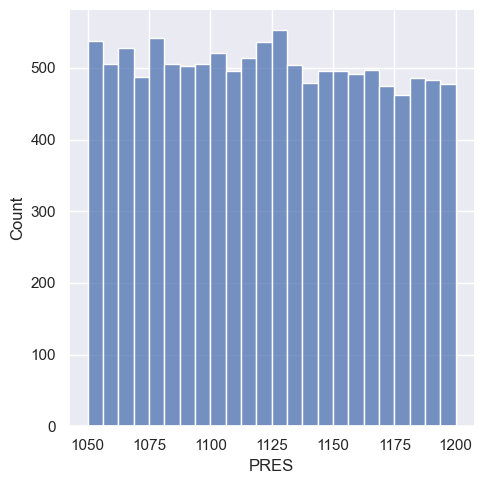

In [166]:
sns.displot(ds_ms["PRES"])

Môžeme vidieť že hodnoty tlaku sú oproti zadaniu výrazne vyššie.

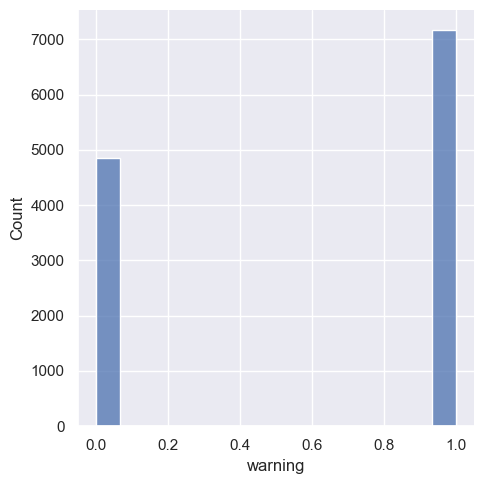

In [167]:
sns.displot(ds_ms["warning"])

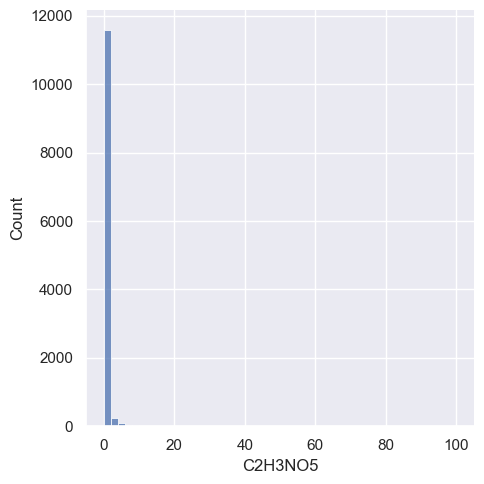

In [168]:
sns.displot(ds_ms["C2H3NO5"], bins = 50)

V distribučnej analýze nás zaujali hodnoty v stĺpci C2H3NO5 nakoľko priemer bol neporovnateľne nižší ako maximálna nameraná hodnota. Rovnako sme sa pzoreli na stĺpec warning, či sa tam náhodou nenachádzajú iné hodnoty ako 0 alebo 1.

<AxesSubplot: >

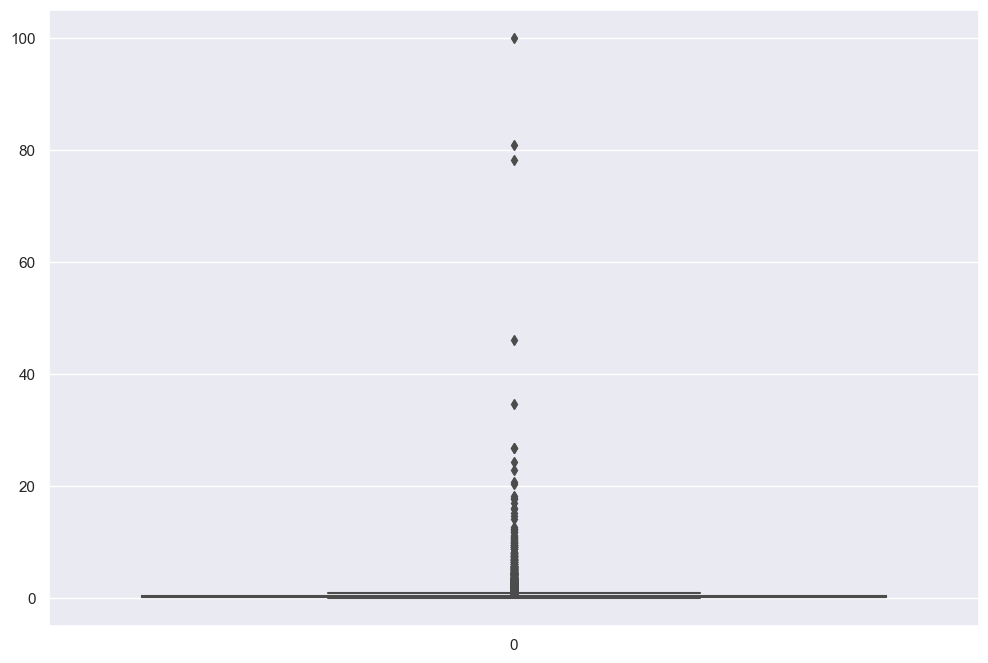

In [169]:
sns.boxplot(data = ds_ms['C2H3NO5'])

<h2>Identifikácia problémov v dátach s prvotným riešením</h2>

Štruktúru dát považujeme za vyhovujúcu nakoľko ms.info nám ukázal že všetky záznamy boli typu float.
Podľa ms.info sme zistili že dataset obsahuje NaN hodnoty. Rozhodli sme sa ich dropnúť pre zjednotenie datasetu.

In [170]:
stations = ds_stations[ds_stations.duplicated() == True].count()
ms = ds_ms[ds_ms.duplicated() == True].count()
print(stations, "\n\n", ms)

latitude     0
QoS          0
location     0
station      0
revision     0
longitude    0
dtype: int64 

 H2CO         177
CH4          176
PM10         176
NOx          177
PRES         178
PM2.5        178
CO           178
O3           177
PAHs         176
latitude     178
C2H3NO5      178
Pb           175
warning      177
CFCs         176
TEMP         177
SO2          178
longitude    178
NH3          178
dtype: int64


Pozreli sme sa na duplicitné záznamy v datasete, no keďže môže ísť o záznamy z rovnakého času iba o sekundu neskôr rozhodli sme sa ich ponechať. Týchto záznamov je cca 180 čo predstavuje zanedbateľné množstvo oproti celému datasetu.

In [171]:
ds_ms_res.dropna(inplace=True)
ds_ms_res.describe()

,H2CO,CH4,PM10,NOx,PRES,PM2.5,CO,O3,PAHs,latitude,C2H3NO5,Pb,warning,CFCs,TEMP,SO2,longitude,NH3
count,11359.000000,11359.000000,11359.000000,11359.000000,11359.000000,11359.000000,11359.000000,11359.000000,11359.000000,11359.000000,11359.000000,11359.000000,11359.000000,11359.000000,11359.000000,11359.000000,11359.000000,11359.000000
mean,52.835142,9.716621,10.217717,9.467816,1123.858687,9.478802,7.640748,10.241318,8.957588,29.354296,0.456406,51.783326,0.597588,51.954232,15.003763,8.951059,10.869923,8.943891
std,13.233265,1.826411,1.515621,1.755504,43.144056,1.713763,1.338603,1.280759,0.999552,23.362887,1.892683,13.110815,0.490406,13.528166,9.968696,0.983378,72.916836,0.994353
min,0.000000,0.000000,2.588530,2.217090,1050.006790,2.760530,2.475540,5.027350,4.781580,-38.653330,0.000000,0.000000,0.000000,0.000000,-22.445920,5.368090,-156.474320,4.585820
25%,43.878790,8.832485,9.231600,8.495310,1086.374955,8.277845,6.736660,9.396070,8.293025,14.954720,0.054790,43.044980,0.000000,42.818455,8.238915,8.297600,-60.473890,8.270760
50%,52.923350,9.950670,10.231980,9.778920,1123.434360,9.658710,7.643140,10.242440,8.965780,36.821670,0.142020,51.750330,1.000000,51.956930,15.064010,8.944860,9.150130,8.963240
75%,61.745075,10.908170,11.199520,10.687205,1160.798110,10.714490,8.546910,11.065880,9.625045,46.754510,0.364260,60.783500,1.000000,61.041805,21.748250,9.603460,72.442440,9.606900
max,100.000000,16.051470,16.827720,14.393620,1199.979550,15.547060,13.676690,16.126770,13.583310,68.798330,100.000000,100.000000,1.000000,100.000000,52.722020,13.169880,178.004170,13.011030


Droplo sa 715 NaN záznamov čo predstavuje ~6% dát. 
Následne sme sa pozreli na priemerné hodnoty dát v pôvodného datasetu voči datasetu po dropnutí NaN hodnôt.
Vidíme že hodnoty z deskriptívnej štatistiky sa skoro vôbec nezmenili.
Z porovnania nám vyzhádza zmena hodnôt v deskriptívnej štatistike v najhoršom prípade o desatiny percent, co považujeme za akceptovateľné.

In [172]:
ds_ms_res.drop("latitude", axis = 1, inplace=True)
ds_ms_res.drop("longitude", axis = 1, inplace=True)
ds_ms_res.describe()

,H2CO,CH4,PM10,NOx,PRES,PM2.5,CO,O3,PAHs,C2H3NO5,Pb,warning,CFCs,TEMP,SO2,NH3
count,11359.000000,11359.000000,11359.000000,11359.000000,11359.000000,11359.000000,11359.000000,11359.000000,11359.000000,11359.000000,11359.000000,11359.000000,11359.000000,11359.000000,11359.000000,11359.000000
mean,52.835142,9.716621,10.217717,9.467816,1123.858687,9.478802,7.640748,10.241318,8.957588,0.456406,51.783326,0.597588,51.954232,15.003763,8.951059,8.943891
std,13.233265,1.826411,1.515621,1.755504,43.144056,1.713763,1.338603,1.280759,0.999552,1.892683,13.110815,0.490406,13.528166,9.968696,0.983378,0.994353
min,0.000000,0.000000,2.588530,2.217090,1050.006790,2.760530,2.475540,5.027350,4.781580,0.000000,0.000000,0.000000,0.000000,-22.445920,5.368090,4.585820
25%,43.878790,8.832485,9.231600,8.495310,1086.374955,8.277845,6.736660,9.396070,8.293025,0.054790,43.044980,0.000000,42.818455,8.238915,8.297600,8.270760
50%,52.923350,9.950670,10.231980,9.778920,1123.434360,9.658710,7.643140,10.242440,8.965780,0.142020,51.750330,1.000000,51.956930,15.064010,8.944860,8.963240
75%,61.745075,10.908170,11.199520,10.687205,1160.798110,10.714490,8.546910,11.065880,9.625045,0.364260,60.783500,1.000000,61.041805,21.748250,9.603460,9.606900
max,100.000000,16.051470,16.827720,14.393620,1199.979550,15.547060,13.676690,16.126770,13.583310,100.000000,100.000000,1.000000,100.000000,52.722020,13.169880,13.011030


C:\Users\Richard\iau_xkello\env\lib\site-packages\seaborn\categorical.py:470: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


<AxesSubplot: >

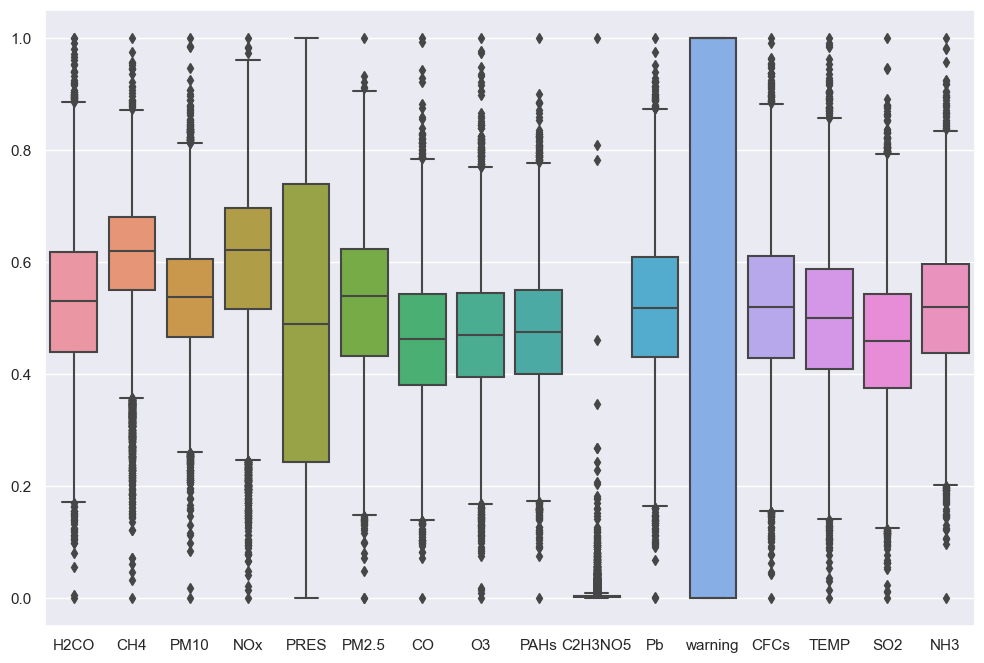

In [173]:
sns.set(rc={'figure.figsize':(12,8)})
ds_ms_scaled = pd.DataFrame(MinMaxScaler().fit_transform(ds_ms_res.select_dtypes("number")), columns=ds_ms_res.select_dtypes("number").columns)
sns.boxplot(data = ds_ms_scaled)

Pri grafickom zobrazení dát vidíme źe naše dáta obsahujú vychýlené hodnoty.

<b>Kontrola korekcie dát v datasete stations.csv:</b>

In [174]:
ds_stations["revision"].unique()

array(['2018-11-28', '07/26/2013, 00:00:00', '01/03/2019, 00:00:00', ...,
       '2020-07-24', '2013/07/06', '2018/06/24'], dtype=object)

In [175]:
ds_stations["location"].unique()

array(['Europe/Istanbul', 'Europe/Stockholm', 'America/Chicago',
       'Asia/Manila', 'Asia/Yekaterinburg', 'America/New_York',
       'Europe/Moscow', 'Africa/Addis_Ababa', 'America/Sao_Paulo',
       'Atlantic/Azores', 'Asia/Kuala_Lumpur', 'Asia/Kolkata',
       'Europe/Rome', 'Africa/Freetown', 'Europe/London', 'Europe/Berlin',
       'America/Bahia', 'Africa/Dar_es_Salaam', 'Asia/Bangkok',
       'America/Los_Angeles', 'Asia/Jakarta', 'Europe/Amsterdam',
       'Africa/Windhoek', 'Australia/Melbourne', 'Europe/Paris',
       'Asia/Shanghai', 'Europe/Brussels', 'America/Phoenix',
       'Europe/Andorra', 'Asia/Tokyo', 'Africa/Niamey', 'Europe/Madrid',
       'Europe/Sofia', 'America/Maceio', 'America/Boise',
       'Asia/Jerusalem', 'America/Mexico_City', 'America/Santiago',
       'Asia/Makassar', 'Europe/Vilnius', 'America/Guayaquil',
       'America/Port-au-Prince', 'Europe/Warsaw', 'Asia/Vladivostok',
       'America/Jamaica', 'America/Caracas', 'America/Vancouver',
       'Ame

In [176]:
ds_stations["station"].unique()

array(['Bergama', 'Boo', 'Odessa', 'Manaoag', 'Kachkanar',
       'Mechanicsville', 'Copperas Cove', 'Dyat‚Äôkovo', 'Arba Minch',
       'Santa Gertrudes', 'Ponta Delgada', 'Ulu Tiram', 'Dalsingh Sarai',
       'San Giuliano Milanese', 'Freetown', 'Strood', 'Likhobory', 'Verl',
       'Muritiba', 'Mwandiga', 'Bua Yai', 'Volla', 'Norco', 'Kidodi',
       'Kirchlengern', 'Losheim', 'Rudolstadt', 'Labuhan Deli', 'Pahrump',
       'Culemborg', 'Gajendragarh', 'Gua Musang', 'Halstenbek', 'Sirsi',
       'Okahandja', 'Wheelers Hill', 'Deltona', 'Santa Maria',
       'Bad Honnef', 'Pamiers', 'Nizhniy Lomov', 'Hartley', 'Sungurlu',
       'Heyuan', 'Rixensart', 'Gilbert', 'Sassari', 'les Escaldes',
       'Pandua', 'Novara', 'Hakodate', 'Mirriah', 'Bryn Mawr-Skyway',
       'Gavrilov-Yam', 'Xiangtan', 'Kaukauna', 'Jumilla', 'Smolyan',
       'Front Royal', 'Yeysk', 'Lagarto', 'Cowes', 'Madhipura', 'Nampa',
       'Fairview Heights', 'Kingston upon Hull', 'Taunton',
       'Evergreen Park', 'Ja

In [177]:
ds_stations["QoS"].unique()

array(['excellent', 'accep', 'maintenance', 'average', 'building', 'good',
       'acceptable', 'maitennce'], dtype=object)

Vidíme že záznamy v datasete stations.csv v stĺpci QoS obsahujú chybné hodnoty.
Tým pádom sú pre jeden stav dve hodnoty. Preto vykonáme korekciu dát.

In [178]:
ds_stations["QoS"].replace(to_replace="accep", inplace=True, value="acceptable")
ds_stations["QoS"].replace(to_replace="maitennce", inplace=True, value="maintenance")
ds_stations["QoS"].unique()

array(['excellent', 'acceptable', 'maintenance', 'average', 'building',
       'good'], dtype=object)

Vykonali sme korekciu dát, pričom vidíme zmenu v datasete stations.csv. Stĺpec QoS už neobsahuje nekorektné záznamy

<h2>Párová analýza dát</h2>

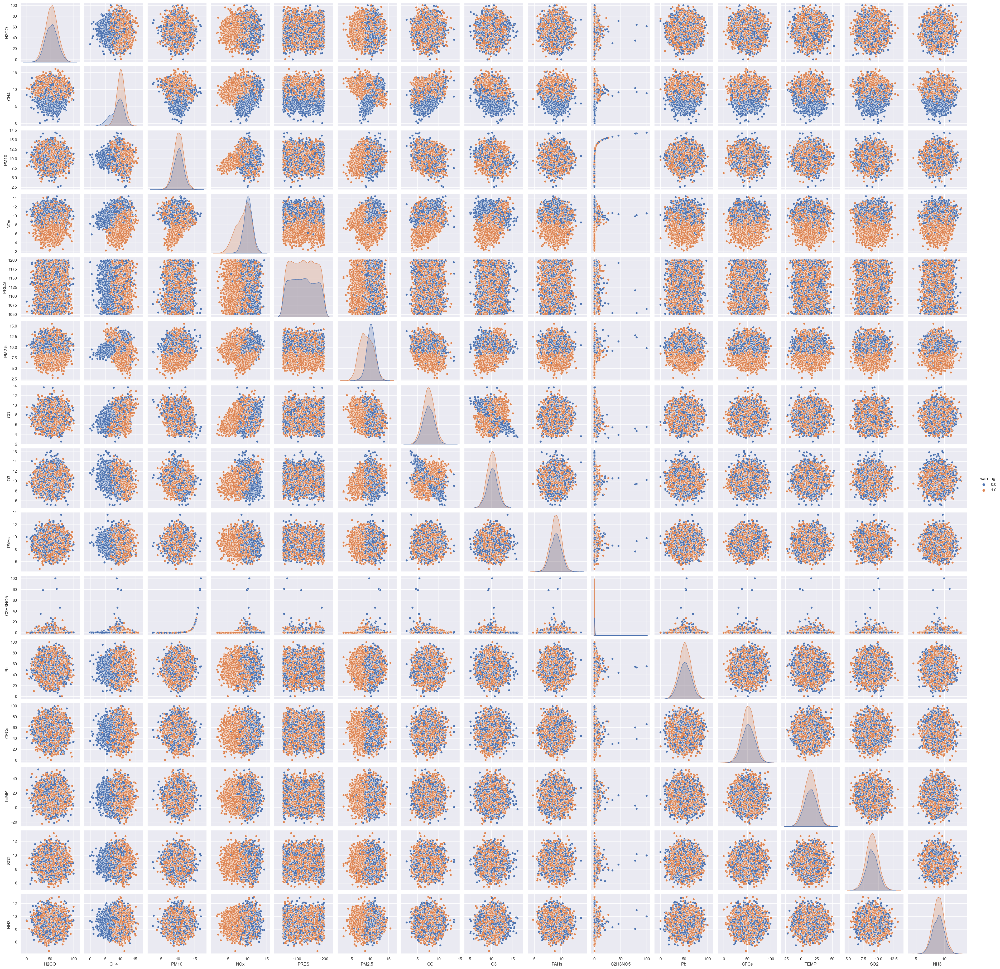

In [179]:
sns.pairplot(ds_ms_res, hue="warning")

In [180]:
ds_ms_res.corr()

,H2CO,CH4,PM10,NOx,PRES,PM2.5,CO,O3,PAHs,C2H3NO5,Pb,warning,CFCs,TEMP,SO2,NH3
H2CO,1.000000,0.009407,-0.003722,0.010495,-0.003869,0.010006,0.007055,0.015379,-0.009125,-0.000815,0.002166,0.002381,-0.010301,0.008997,0.010176,-0.002849
CH4,0.009407,1.000000,-0.117048,-0.037180,0.005727,-0.228676,0.267667,-0.205769,-0.003039,-0.024287,-0.008227,0.321735,0.001912,-0.002695,-0.020786,0.001163
PM10,-0.003722,-0.117048,1.000000,0.099950,0.000123,0.065861,-0.130690,-0.055110,0.001228,0.404705,0.009880,0.004995,-0.005269,-0.006331,0.005846,0.006103
NOx,0.010495,-0.037180,0.099950,1.000000,-0.000670,-0.025599,0.180268,0.214378,-0.011294,0.051310,-0.012588,-0.357578,0.003366,-0.006447,0.007189,0.006993
PRES,-0.003869,0.005727,0.000123,-0.000670,1.000000,-0.004606,0.009515,0.002509,-0.005143,-0.014074,-0.004103,0.012583,0.004626,-0.008674,0.001776,0.001821
PM2.5,0.010006,-0.228676,0.065861,-0.025599,-0.004606,1.000000,-0.165783,0.090218,-0.013924,0.021446,0.013626,-0.357987,0.012193,0.008025,-0.005251,0.020290
CO,0.007055,0.267667,-0.130690,0.180268,0.009515,-0.165783,1.000000,-0.110965,0.006483,-0.094035,-0.005517,-0.004355,0.009838,0.009073,-0.007576,0.003418
O3,0.015379,-0.205769,-0.055110,0.214378,0.002509,0.090218,-0.110965,1.000000,-0.002334,-0.029086,-0.001873,-0.006409,0.015534,0.015810,0.005456,0.006270
PAHs,-0.009125,-0.003039,0.001228,-0.011294,-0.005143,-0.013924,0.006483,-0.002334,1.000000,0.002157,-0.007554,-0.001515,0.005614,0.001617,-0.010775,0.000512
C2H3NO5,-0.000815,-0.024287,0.404705,0.051310,-0.014074,0.021446,-0.094035,-0.029086,0.002157,1.000000,0.008717,-0.018859,-0.006334,-0.002370,0.001950,0.008326


<AxesSubplot: >

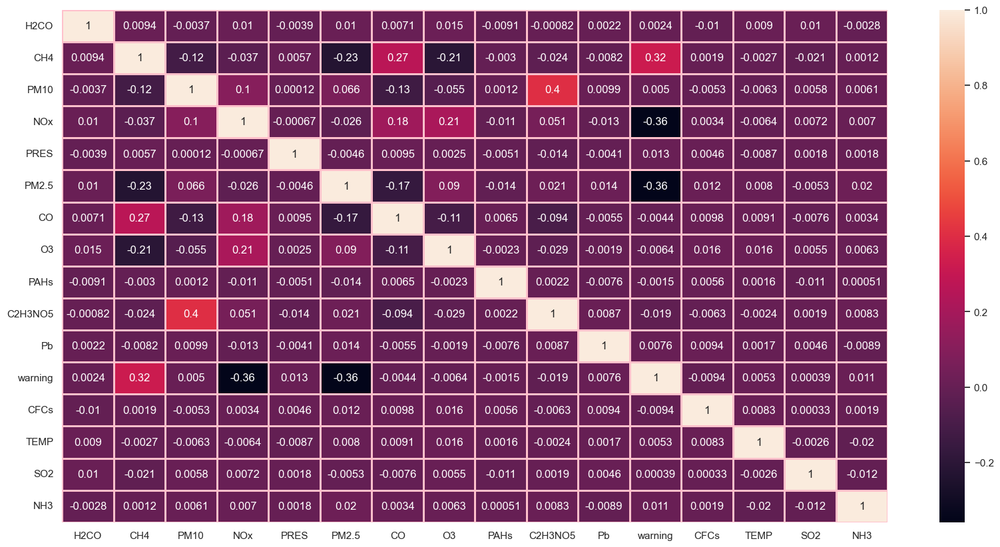

In [181]:
fig, ax = plt.subplots(figsize=(20,10)) 
ax = sns.heatmap(ds_ms_res.corr(), linewidths=1, linecolor= 'pink', annot=True)
ax

Grafické vyzobrazenie heatmap, identifikuje vzťahy medzi dvojicami atribútov. Pri analýze vzťahov korelacií na našej mape vidíme že najvyšiu pozitívnu hodnotu v závisloti našej predikovanej hodnoty warning má práve látka CH4 (metán), z čoho môžeme dalej súdiť že so zvýšenim obsahu CH4 vo vzduchu nám klesa kvalita ovzdušia. Zatiaľ čo keď sa pozrieme na látku SO2 vidíme že nám nijakým spôsobom neovplňuje kvalitu ovzdušia.
#negatívna korelácia

<AxesSubplot: xlabel='warning', ylabel='CH4'>

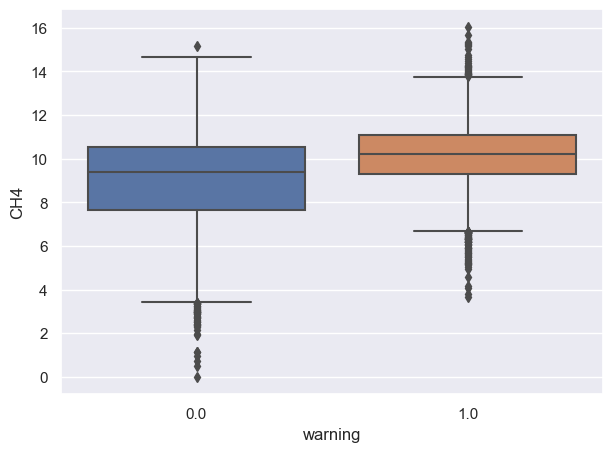

In [182]:
sns.set(rc={'figure.figsize':(7,5)})
sns.boxplot(data=ds_ms_res, x="warning", y="CH4")

Podľa tabuľky korelácií sme zvolili prvok ktorý najviac koreloval s hodnotou warning. Kladná korelácie prvku CH4 s hodnotou warning nám značí že výskyt danej látky v ovzduší nepriaznivo ovplyvňuje kvalitu vzduchu.

<AxesSubplot: xlabel='warning', ylabel='SO2'>

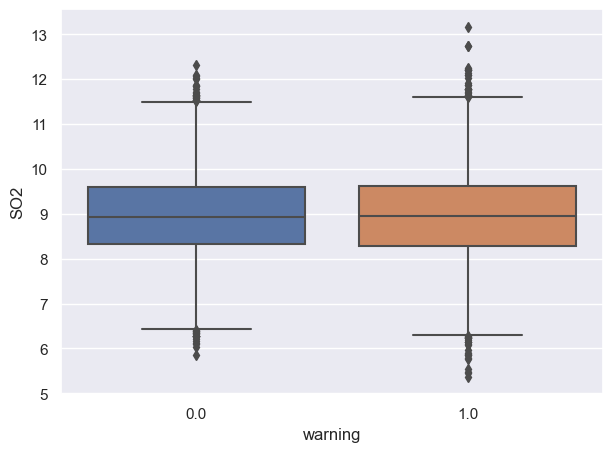

In [183]:
sns.set(rc={'figure.figsize':(7,5)})
sns.boxplot(data=ds_ms_res, x="warning", y="SO2")

Ďalej sme sa pozreli na prvok SO2. Jeho hodnota korelácie s hodnotou warning sa najviac poriblížila k nule. Na základe čoho môžeme konštatovať že jeho prítomnosť alebo naopak neprítomnosť nemá žiadny vplyv na kvalitu ovzdušia. 

<AxesSubplot: xlabel='QoS', ylabel='count'>

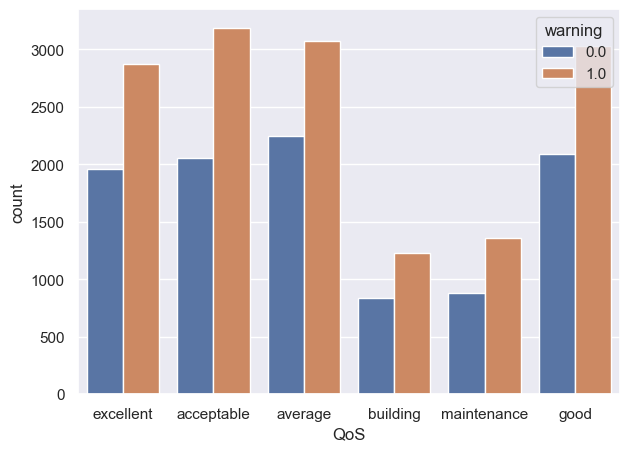

In [184]:
joined_df = ds_stations.merge(ds_ms, left_on=["latitude", "longitude"], right_on=["latitude", "longitude"])
sns.countplot(data=joined_df, x="QoS", hue="warning")

Vidíme že QoS (Quality of Service) nemá žiadny vplyv na namerané hodnoty nakoľko hodnoty pri všetkých porovnaniach boli približne v pomere 3:4.

<h1>Hypotéza 1</h1>

<h2>Pri predikovanej hodnote kvality ovzdušia 0 budú namerané hodnoty SO2 rovanké ako pri predikovanej hodnote kvality ovzdušia 1</h2>

<b>H<sub>0</sub></b> = Namerané hodnoty SO2 sú priemerne rovnaké pre predikované hodnoty kvality ovzdušia 0 ako aj 1.<br>
<b>H<sub>A</sub></b> = Pri predikovanej hodnote kvality ovzdušia 0 budú namerané hodnoty látky SO2 priemerne menšie alebo väčšie ako pri predikovanej hodnote kvality ovzdušia 1.

Na overenie našej hypotézy použijeme študentov t-test. No najskôr však musíme overiť predpoklady použitia t-testu ako podobnosť vraiancie a normálne rozdelenie dát.

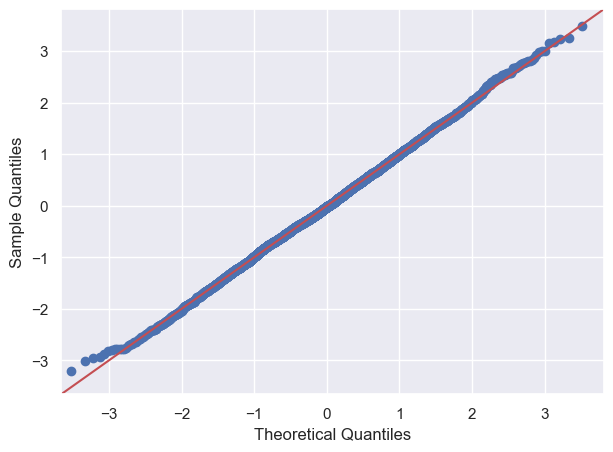

In [185]:
good = ds_ms_res.loc[ds_ms_res.warning == 0, "SO2"]
bad = ds_ms_res.loc[ds_ms_res.warning == 1, "SO2"]

g_QQ = sm.ProbPlot(good, fit=True).qqplot(line="45")

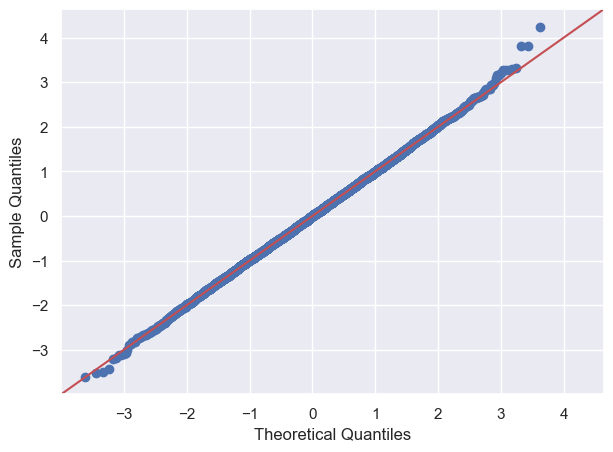

In [186]:
b_QQ = sm.ProbPlot(bad, fit=True).qqplot(line="45")

Na vizuálne overenie normálneho rozdelenia dát sme použili QQ plot. Z grafov vyplíva že dáta formujú priamku teda pravdepodobne pochádzajú z rovankého rozdelenia.

In [187]:
stats.shapiro(good)

ShapiroResult(statistic=0.9993743896484375, pvalue=0.12072388827800751)

In [188]:
stats.shapiro(bad)

C:\Users\Richard\iau_xkello\env\lib\site-packages\scipy\stats\_morestats.py:1800: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


ShapiroResult(statistic=0.9998034238815308, pvalue=0.8292591571807861)

Grafické zobrazenie normálnosti rozdelenia dát sme overili taktiež pomocou Shapiro-Wilkovho testu. Na základe výsledkov testu vidíme že obe predikované hodnoty pochádzajú z normálneho rozdelenia keďže hodnoty <b><i>p</i></b> boli väčšie ako 0.05.

In [189]:
stats.levene(good, bad)

LeveneResult(statistic=4.097430406862885, pvalue=0.04297180167007974)

Varianciu dát sme overili Levenovím testom. Vyšlo nám že hodnota <b><i>p</i></b> bola menšia ako 0.05 takže nemôžeme prehlásiť že by vzorky pochádzali z distribúcií z rovnakými varianciami.

Rozhodli sme sa nahradiť Studentov T-test druhím a to síce MannWhitneyu testom nakoľko sa nesplnili oba predpoklady t-testu.

In [190]:
stats.mannwhitneyu(good, bad)

MannwhitneyuResult(statistic=15491436.5, pvalue=0.8953809165679365)

Výsledok testu pre hodnotu <b><i>p</i></b> bol väčší ako 0.001 teda zamietame našu alternatívnu hypotézu <b>H<sub>A</sub></b> v prospech nulovej hypotézy <b>H<sub>0</sub></b>

<h1> Hypoteza 2 </h1>

<h2>Pri predikovanej hodnote kvality ovzdušia 0 budú namerané hodnoty CH4 rovnaké ako predikovanej hodnote kvality ovzdušia 1</h2>

<b>H<sub>0</sub></b> = Namerané hodnoty CH4 sú priemerne rovnaké pri predikovanej hodnote ovzdušia oproti predikovanej hodnote ovzdušia 1<br>

<b>H<sub>A</sub></b> = Pri predikovanej hodnote kvality ovzdušia 0 budú namerané hodnoty látky CH4 priemerne menšie alebo väčšie ako pri predikovanej hodnote kvality ovzdušia 1.

<AxesSubplot: xlabel='warning', ylabel='CH4'>

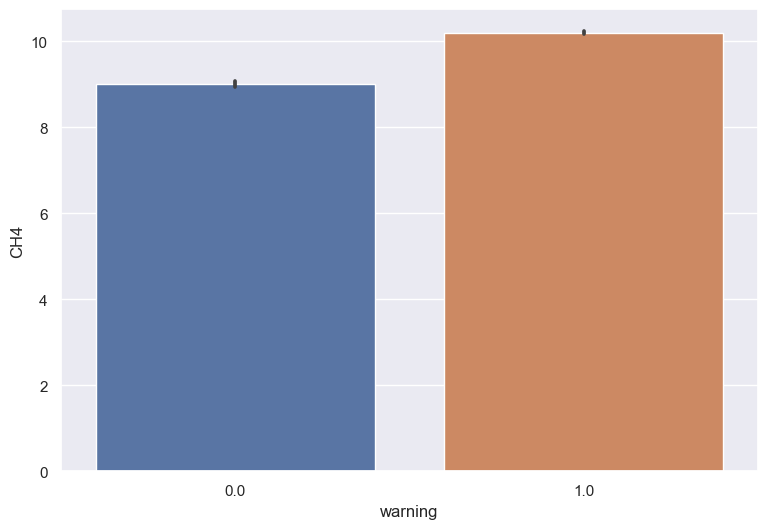

In [191]:
h2_good = ds_ms_res.loc[ds_ms_res.warning == 0, "CH4"]
h2_bad = ds_ms_res.loc[ds_ms_res.warning == 1, "CH4"]

sns.set(rc={'figure.figsize':(9,6)})
sns.barplot(x="warning", y="CH4", data=ds_ms_res)

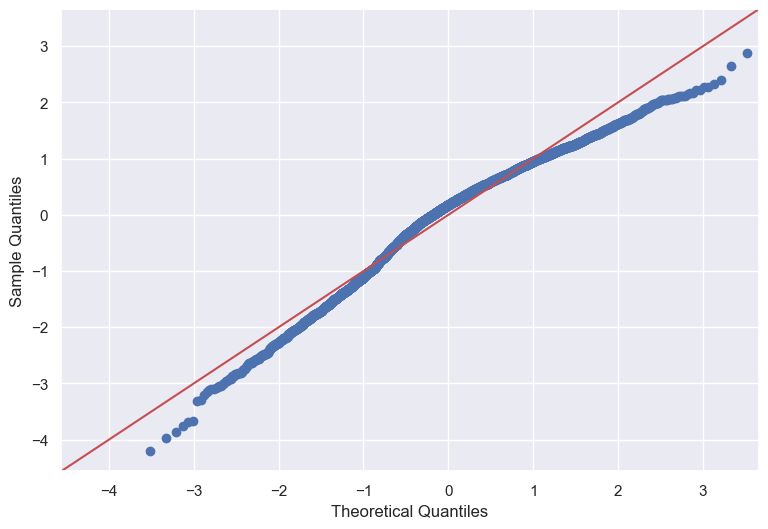

In [192]:
g_QQ = sm.ProbPlot(h2_good, fit=True).qqplot(line="45")

Na základe QQ grafu vidíme že hodnoty neformujú priamku a teda sme usúdili že nepochádzajú z normálneho rozdelenia.

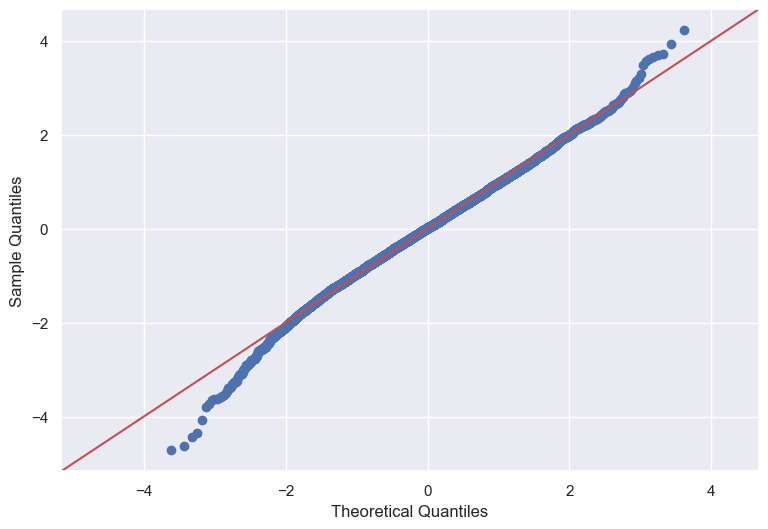

In [193]:
b_QQ = sm.ProbPlot(h2_bad, fit=True).qqplot(line="45")

Z QQ grafu sa javí že hodnoty formujú priamku a preto ďalej overíme oba grafy Shapirovím testom.

In [194]:
stats.shapiro(h2_good)

ShapiroResult(statistic=0.9704635143280029, pvalue=1.0670565956312486e-29)

In [195]:
stats.shapiro(h2_bad)

C:\Users\Richard\iau_xkello\env\lib\site-packages\scipy\stats\_morestats.py:1800: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


ShapiroResult(statistic=0.9960420727729797, pvalue=1.2839527618185853e-12)

Zo testovania dát Shapirovím testom vyplinulo že hodnoty <b><i>p</i></b> sú v oboch prípadoch menej ako 0.05. To nám svedčí o nie normálnom rozdelení dát v oboch prípadoch. Ukázalo sa že hodnoty v druhom grafe ktorý sa javil ako priamka boli pravdepodobne vo väčšine outliery a teda nás graf zavádzal.

In [196]:
stats.levene(h2_good, h2_bad)

LeveneResult(statistic=809.3692008347563, pvalue=4.8986922960462126e-172)

Varianciu dát sme overili Levenovím testom. Vyšlo nám že hodnota <b><i>p</i></b> bola menšia ako 0.05 takže nemôžeme prehlásiť že by vzorky pochádzali z distribúcií z rovnakými varianciami.

Rozhodli sme sa nahradiť Studentov T-test druhím a to síce MannWhitneyu testom nakoľko sa nesplnili oba predpoklady t-testu.

In [197]:
stats.mannwhitneyu(h2_good, h2_bad)

MannwhitneyuResult(statistic=10522454.5, pvalue=1.760562315957438e-186)

Výsledok Mannwhitneyu testu pre hodnotu <b><i>p</i></b> bol menší ako 0.001 teda zamietame našu nulovú hypotézu H0 v prospech alternatívnej hypotézy HA